In [1]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
import wave
from pathlib import Path
from scipy import interpolate, signal as scipy_signal
from IPython.lib.display import Audio

## Create pentatonic equal temperament frequencies
To generate all note frequencies I use equal temperament with A4 = 440hz
You can derive the other notes by counting the amount of steps from the A4 by using the formula:

$$f_{n} = f_{0} \cdot 2^{\frac{1}{12}^{n}}$$


Where f(0) is 440 hz and n the amount of steps from A4 (so 1 for Bb, 2 for B, 3 for C etc)

In [2]:
note_names =       ["C", "Db", "D", "Eb", "E", "F", "Gb", "G", "Ab", "A", "Bb", "B", ]
note_names_sharp = ["C", "C#", "D", "D#", "E", "F", "F#", "G", "G#", "A", "A#", "B", ]

# scales = {
#     "A": ["A", "B", "C#", "Db", "D", "E" , "F#", "G#"],
#     "B": ["A#", "Bb", "B", "C#", "D#", "Eb", "E", "F#", "G#"],
#     "G": ["A", "B", "C", "D", "E", "F#", "G"],
# }
notes = dict()

for note_name in note_names:
    for octave in range(10):
        a_index = note_names.index("A")
        
        note_index = note_names.index(note_name)
        inside_octave_steps = note_index - a_index
        outside_octave_steps = (octave - 4) * 12
        step_diff = inside_octave_steps + outside_octave_steps
        
        frequency = 440 * (2**(1/12)) ** step_diff
#         frequency = step_diff
        notes[f"{note_name}{octave}"] = frequency
        if "b" in note_name:
            sharp_name = f"{note_names_sharp[note_index]}{octave}"
            notes[sharp_name] = frequency 
notes = dict(sorted(notes.items(), key= lambda x: x[1]))

In [3]:
def normalize_volume(signal, min_val=-1, max_val=1):
    """
    Function for normalizing the volume of a signal or wav file. 
    All values are scale to the domain [-1, 1]
    """
    max_val = max(signal)
    min_val = min(signal)
    
    signal = signal / max(abs(min_val), max_val)
    return signal


def change_pitch(signal, steps, step_size=2**(1/12)):
    """
    Change the pitch of a given signal or wav file.
    Uses pentatonic steps to determine by how much.
    """
    new_length = len(signal) * step_size ** (-steps)
    return scipy_signal.resample(signal, round(new_length))


In [4]:
def make_chord(*args, play_time_seconds=3, framerate=44100):
    """
    Create a chord given the frequencies as args.
    
    :param play_time_second: The amount of seconds the given signal should last
    :param framerate: The framerate in which to generate the signal.
    """
    t = np.linspace(0, play_time_seconds, framerate*play_time_seconds)
    notes = [np.sin(2*np.pi*freq*t) for freq in args]
    audio_data = sum(notes)
    return audio_data

In [5]:
def chord(root, overtones):
    """
    Create a chord based on the root note frequency and 
    the amount of steps on top of it.
    
    example:
    C chord = chord(notes["c4"], [4, 7])
    
    """
    frequencies = [root]
            
    for overtone in overtones:
        note = root * (2**(1/12))**overtone
        frequencies.append(note)
    return make_chord(*frequencies)

In [6]:
def plot_soundwave(signal, upper_limit=None, lower_limit=None, framerate=44100, **kwargs):
    time_axis = np.linspace(0, len(signal) / framerate, num=len(signal))

    if upper_limit:
        signal = signal[:upper_limit]
        time_axis = time_axis[:upper_limit]
    if lower_limit:
        signal = signal[lower_limit:]
        time_axis = time_axis[lower_limit:]
    plt.plot(time_axis, signal, **kwargs)


'C major'

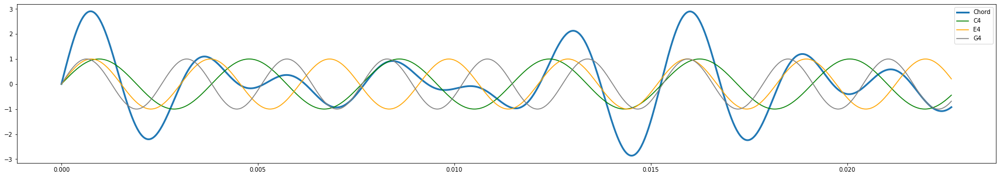

'C minor'

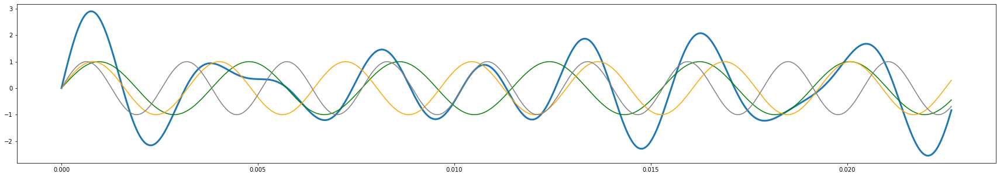

In [7]:
c_major_chord = make_chord(notes["C4"], notes["E4"], notes["G4"])
c_minor_chord = make_chord(notes["C4"], notes["Eb4"], notes["G4"])

display("C major")
fig = plt.figure(1, figsize=(30, 5))
plot_soundwave(c_major_chord, upper_limit=1000, linewidth=3, label="Chord")
plot_soundwave(make_chord(notes["C4"]), upper_limit=1000, color="green", label="C4")
plot_soundwave(make_chord(notes["E4"]), upper_limit=1000, color="orange", label="E4")
plot_soundwave(make_chord(notes["G4"]), upper_limit=1000, color="grey", label="G4")
plt.legend()
plt.show()
display(Audio(c_major_chord, rate=44100, autoplay=True))
display("C minor")
plt.figure(1, figsize=(30, 5))
plot_soundwave(c_minor_chord, upper_limit=1000, linewidth=3, label="Chord")
plot_soundwave(make_chord(notes["C4"]), upper_limit=1000, color="green", label="C4")
plot_soundwave(make_chord(notes["Eb4"]), upper_limit=1000, color="orange", label="Eb4")
plot_soundwave(make_chord(notes["G4"]), upper_limit=1000, color="grey", label="G4")
plt.show()
display(Audio(c_minor_chord, rate=44100, autoplay=True))


# Load files from soundswaves.net


In [8]:
main_dir = Path("./soundwaves.net").absolute()
sound_files = list(main_dir.iterdir())

11


[PosixPath('/tf/Music/soundwaves.net/Kawai-K5000W-Pizzicto-C5.wav'),
 PosixPath('/tf/Music/soundwaves.net/Roland-JD-990-Pizzicato-Strings-C4.wav'),
 PosixPath('/tf/Music/soundwaves.net/Kawai-K1r-Pizzicato-C4.wav'),
 PosixPath('/tf/Music/soundwaves.net/Roland-JV-2080-PizzicatoStr-C5.wav'),
 PosixPath('/tf/Music/soundwaves.net/Alesis-Fusion-Pizzicato-Strings-C4.wav'),
 PosixPath('/tf/Music/soundwaves.net/Alesis-S4-Plus-Wide-Pizzi-C5.wav'),
 PosixPath('/tf/Music/soundwaves.net/Ensoniq-SQ-1-Pizzicato-C5.wav'),
 PosixPath('/tf/Music/soundwaves.net/Roland-D-20-Pizzicato-C4.wav'),
 PosixPath('/tf/Music/soundwaves.net/Casio-VZ-10M-Pizzicato-Bell-C4.wav'),
 PosixPath('/tf/Music/soundwaves.net/Korg-TR-Rack-Pizzicato-Ensemble-C4.wav'),
 PosixPath('/tf/Music/soundwaves.net/Korg-01W-Pizzicato-C5.wav')]

/tf/Music/soundwaves.net/Kawai-K5000W-Pizzicto-C5.wav


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


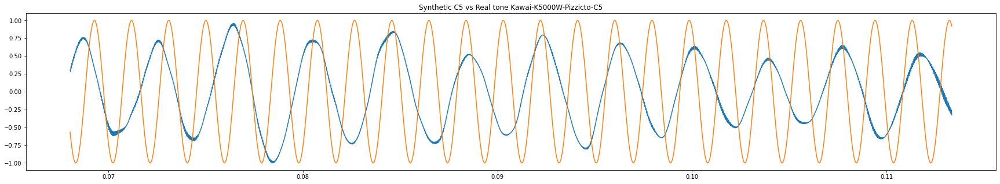

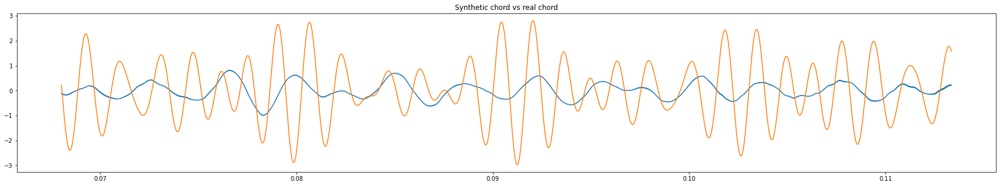

/tf/Music/soundwaves.net/Roland-JD-990-Pizzicato-Strings-C4.wav


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


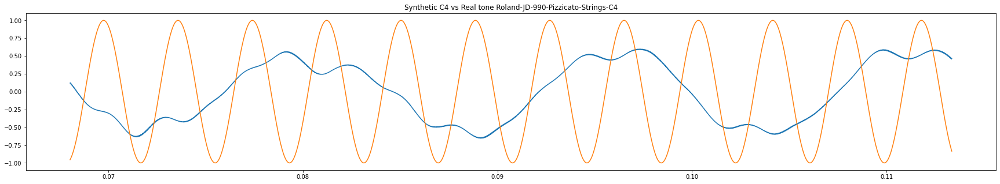

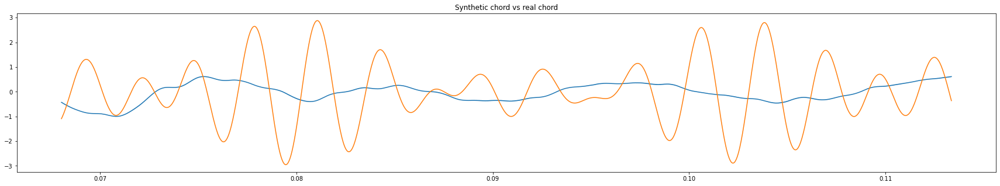

/tf/Music/soundwaves.net/Kawai-K1r-Pizzicato-C4.wav


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


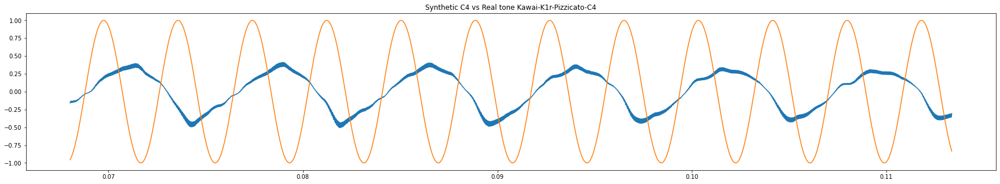

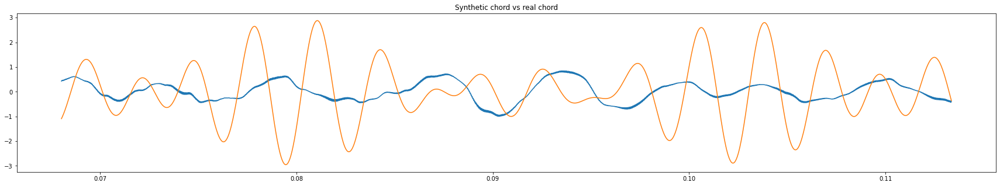

/tf/Music/soundwaves.net/Roland-JV-2080-PizzicatoStr-C5.wav


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


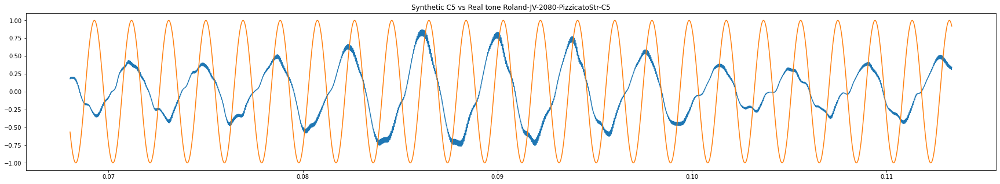

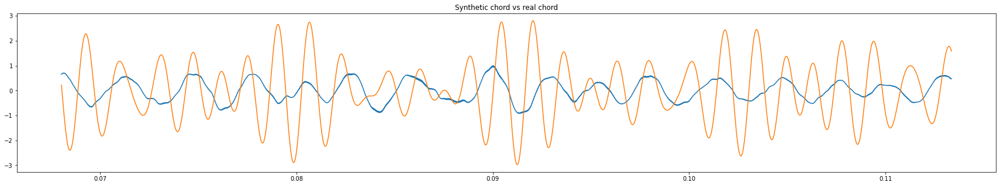

/tf/Music/soundwaves.net/Alesis-Fusion-Pizzicato-Strings-C4.wav


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


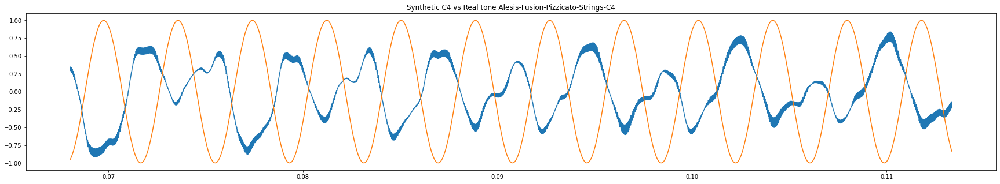

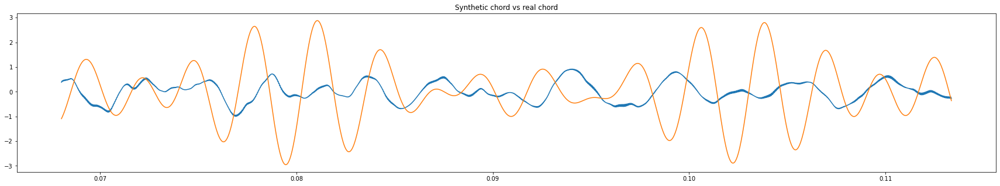

/tf/Music/soundwaves.net/Alesis-S4-Plus-Wide-Pizzi-C5.wav


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


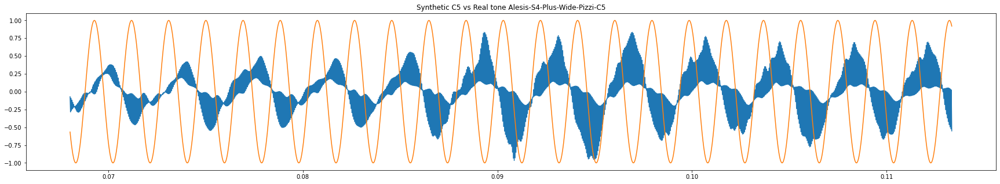

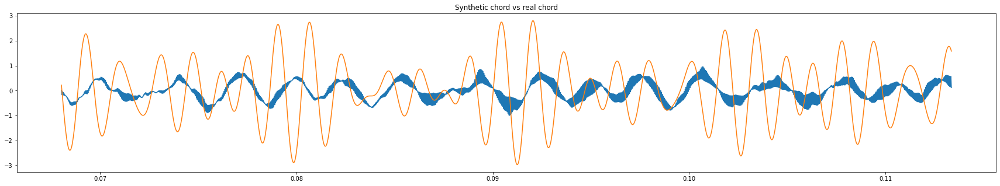

/tf/Music/soundwaves.net/Ensoniq-SQ-1-Pizzicato-C5.wav


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


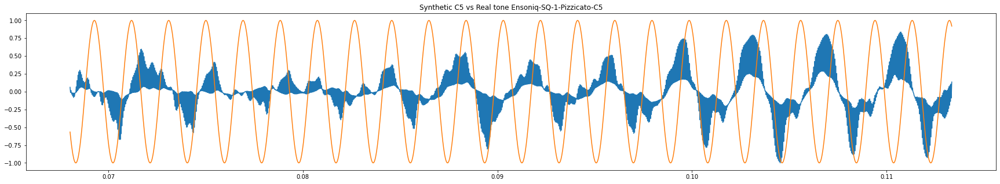

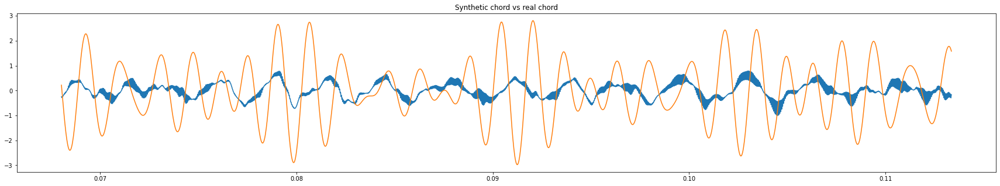

/tf/Music/soundwaves.net/Roland-D-20-Pizzicato-C4.wav


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


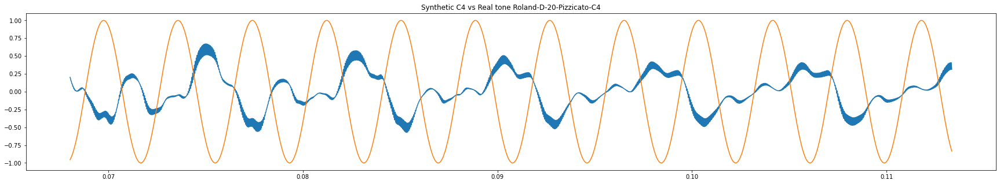

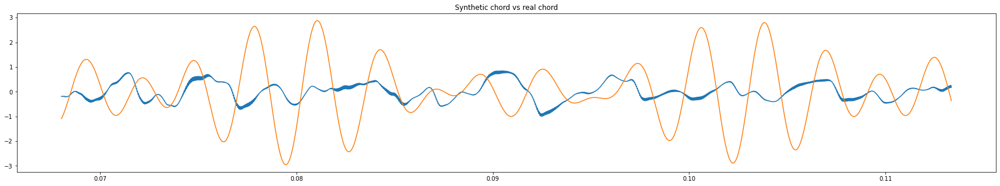

/tf/Music/soundwaves.net/Casio-VZ-10M-Pizzicato-Bell-C4.wav


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


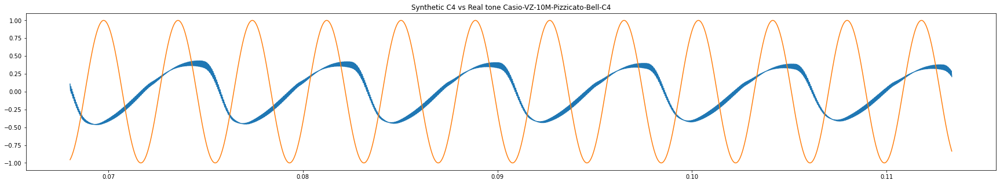

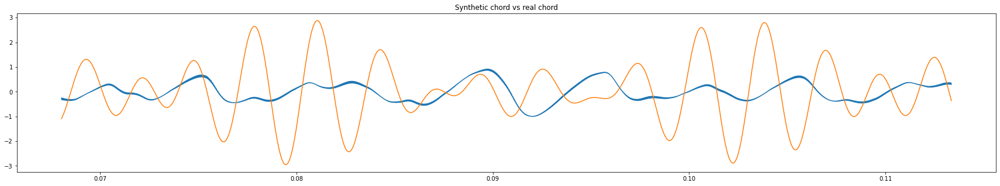

/tf/Music/soundwaves.net/Korg-TR-Rack-Pizzicato-Ensemble-C4.wav


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


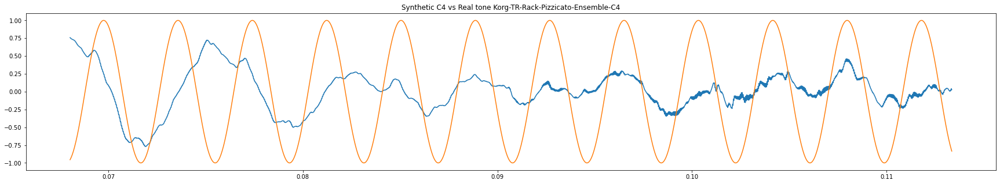

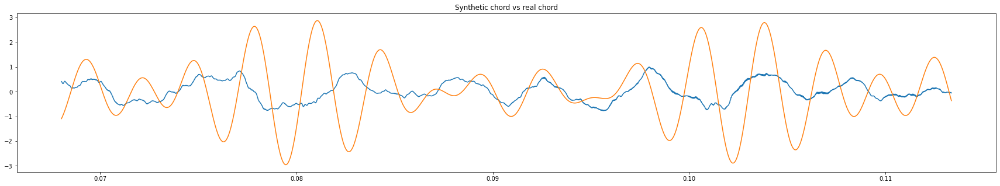

/tf/Music/soundwaves.net/Korg-01W-Pizzicato-C5.wav


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


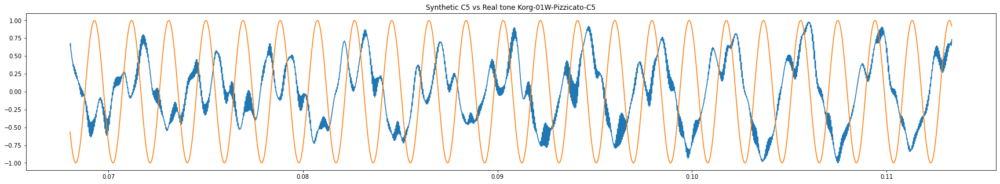

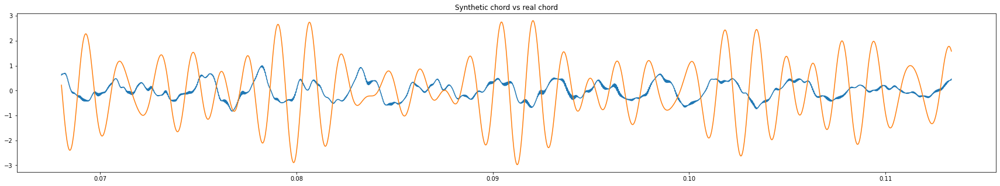

In [16]:
import re
filtered_sound_files = [x for x in sound_files if re.search(r"[A-Ga-g][#b]?\d", str(x).split("-")[-1]) 
#                         and "Clarinet" in str(x)
                          and "Pizzi" in str(x)
                       ]
# print(len(sound_files))
print(len(filtered_sound_files))
display(filtered_sound_files)


for audio_path in filtered_sound_files[:30]:
    
    print(audio_path)
    name = audio_path.stem
    m = re.search(r"([A-Ga-g][#b]?\d)", name.split("-")[-1])
    note_name = m.group(0).upper()
    
    try:
        with wave.open(str(audio_path), "r") as f:
            signal = f.readframes(-1)
            signal = np.fromstring(signal, "Int16")
            synthetic_signal = make_chord(notes[note_name], play_time_seconds=2)
            synthetic_chord = chord(notes[note_name], [3, 5])
            
            chord_notes = [signal, change_pitch(signal, 4), change_pitch(signal, 7)]
            min_length = min([len(s) for s in chord_notes])
            chord_notes = [s[:min_length] for s in chord_notes]
            chordified = sum(chord_notes)

            signal = normalize_volume(signal)
            synthetic_signal = normalize_volume(synthetic_signal)

            n_channels = f.getnchannels()
            wav_framerate = f.getframerate()

            time_axis = np.linspace(0, len(signal) / wav_framerate, num=len(signal))


            plt.figure(1, figsize=(30, 5))
            lower_limit = 3000
            upper_limit = 5000
            plt.title(f"Synthetic {note_name} vs Real tone {name}")
            plt.plot(time_axis[lower_limit:upper_limit], signal[lower_limit:upper_limit],)
            plt.plot(time_axis[lower_limit:upper_limit], synthetic_signal[lower_limit:upper_limit])
            plt.show()
            
            plt.figure(1, figsize=(30, 5))
            plt.title(f"Synthetic chord vs real chord")
            plt.plot(time_axis[lower_limit:upper_limit], normalize_volume(chordified[lower_limit:upper_limit]))
            plt.plot(time_axis[lower_limit:upper_limit], synthetic_chord[lower_limit:upper_limit])
            plt.show()
            display(Audio(signal, rate=44100, autoplay=False))
            

        
            n = int(np.ceil(88200/len(chordified)))
            chordified = np.tile(chordified, n)
    
            display(Audio(chordified, rate=44100, autoplay=False))
            display(Audio(synthetic_signal, rate=44100, autoplay=False))
    except Exception as e:
        print(e)

In [12]:
Audio(make_chord(notes["C4"], notes["E4"], notes["G4"], notes["Bb4"]), rate=44100, autoplay=True)